In [1]:
#Import library
import datetime
import praw
import pandas as pd
import time
import re
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import nltk
import uuid
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
# Download necessary NLTK data
nltk.download('punkt', quiet=True)
nltk.download('stopwords', quiet=True)


True

<h3>Data Preprocessing</h3>

In [3]:
from langdetect import detect

post = pd.read_csv('reddit_posts.csv')
comm = pd.read_csv('reddit_comments.csv')

# ##Data Preprocessing
def preprocess_data(df):
    df['date'] = pd.to_datetime(df['created_utc'], unit='s')

    if 'title' in df.columns and 'text' in df.columns:
        df['clean_text'] = df['title'].fillna('') + ' ' + df['text'].fillna('')
    elif 'text' in df.columns:
        df['clean_text'] = df['text'].fillna('')
    else:
        raise ValueError("DataFrame does not contain 'text' column")

    df['clean_text'] = df['clean_text'].apply(clean_text)
    #df['language'] = df['clean_text'].apply(detect_language)
    
    df = df[~(df['clean_text'].apply(lambda x: isinstance(x, float)))]
        
    return df

def clean_text(text):
    # define your extra stop-words
    CUSTOM_STOP = {'ive', 'go', 'live', 'im', 'get', 'gotta' ,'way', 'people', 'gon' , 'na', 'dont','make','also','already','feel','put','youre','put','phone','theres','subredditmessagecomposetormelbourne'}
    # Remove urls
    text = re.sub(r'http\S+', '', text)
    # Remove @ mentions
    text = re.sub(r'@\w+', '', text)
    # Remove numbers
    text = re.sub(r'\d+\.*\d*', '', text)
    # Remove characters other than letters
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    # Remove emojis
    text = re.sub(r'[^\x00-\x7F]+', '', text)
    # Convert to lowercase
    text = text.lower()
    # Tokenize words
    tokens = word_tokenize(text)
    # Remove stop words
    stop_words = set(stopwords.words('english')) | CUSTOM_STOP
    tokens = [word.strip() for word in tokens if word.strip() not in stop_words]
    return ' '.join(tokens)

def detect_language(text):
    try:
        return detect(text)
    except:
        return 'unknown'


print("\n2. Preprocessing data...")
posts_df = preprocess_data(post)
comments_df = preprocess_data(comm)
print("Preprocessing complete.")

#saving processed data
posts_df.to_csv(f"processed_reddit_posts.csv", index=False)
comments_df.to_csv(f"processed_reddit_comments.csv", index=False)

# initialise preprocessed data
posts_df = pd.read_csv('processed_reddit_posts.csv')
comments_df = pd.read_csv('processed_reddit_comments.csv')

# remove clean text which are null in comments
comments_df_cleaned = comments_df.dropna(subset=['clean_text']).reset_index(drop=True)

# remove clean text which is posts
posts_df_cleaned = posts_df.dropna(subset=['clean_text']).reset_index(drop=True)


2. Preprocessing data...
Preprocessing complete.


In [4]:
post_df = posts_df_cleaned.copy() 
df = comments_df_cleaned.copy()

In [5]:
#df[df['language']!='en']

In [80]:
df.shape

(47547, 15)

<h3>Exploratory Data Analysis</h3>

In [7]:
from wordcloud import WordCloud
def plot_wordcloud(text):
    all_words = ' '.join(text)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_words)
    plt.figure(figsize=(10,5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title('Most Common Words')
    plt.show()

In [8]:
def word_frequency(text):
    word_freq = pd.Series(' '.join(text).split()).value_counts()
    plt.figure(figsize=(20, 10))
    word_freq.head(30).plot(kind='bar')
    plt.title(f'Frequency of the top 30 appearing words')
    plt.xlabel('Words')
    plt.ylabel('Frequency')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

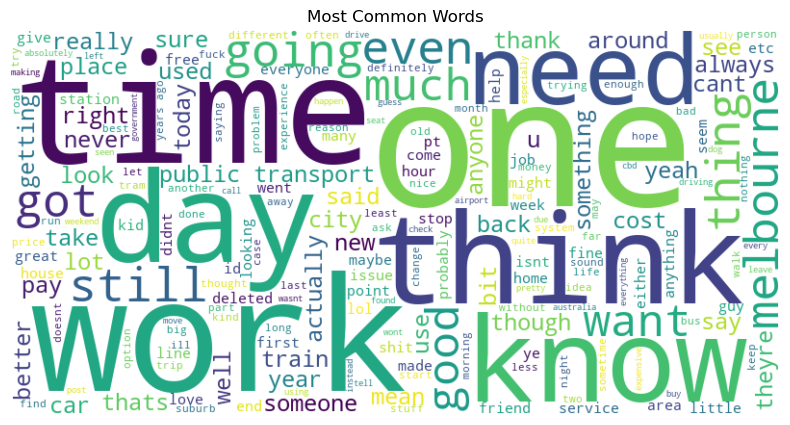

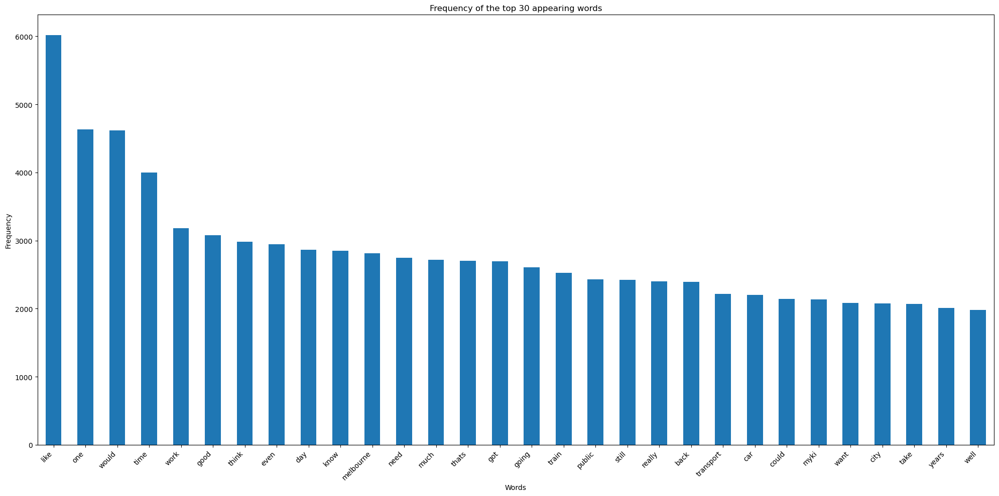

In [9]:
text = df['clean_text']
plot_wordcloud(text)
word_frequency(text)

The above word cloud telling conversation is broad 

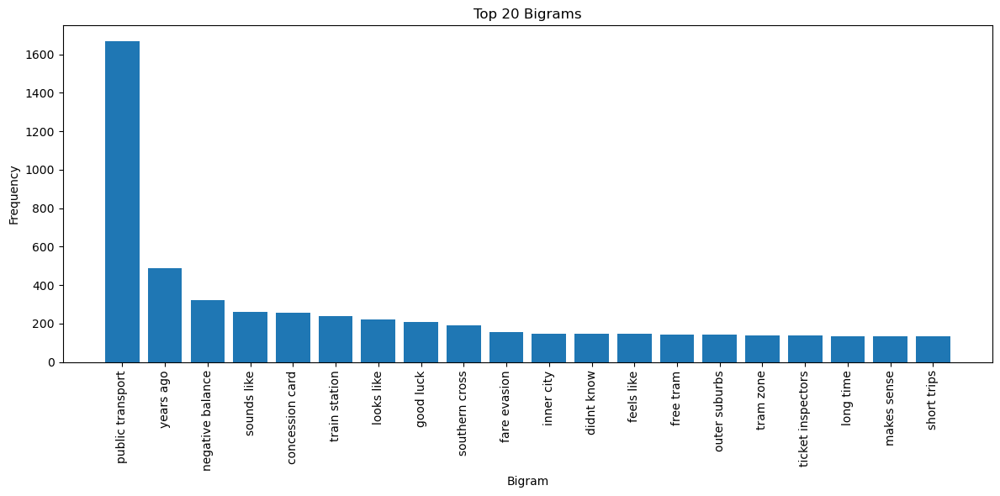

In [10]:
from sklearn.feature_extraction.text import CountVectorizer
import matplotlib.pyplot as plt

# 1. Build bigram counts
vec = CountVectorizer(ngram_range=(2, 2), stop_words='english', min_df=5)
X = vec.fit_transform(df['clean_text'])

# 2. Sum up frequencies and pick top N
freqs = list(zip(vec.get_feature_names_out(), X.sum(axis=0).A1))
top_n = 20
top_bigrams = sorted(freqs, key=lambda x: -x[1])[:top_n]
phrases, counts = zip(*top_bigrams)

# 3. Plot as a bar chart
plt.figure(figsize=(12, 6))
plt.bar(range(len(phrases)), counts)
plt.xticks(range(len(phrases)), phrases, rotation=90)
plt.xlabel('Bigram')
plt.ylabel('Frequency')
plt.title(f'Top {top_n} Bigrams')
plt.tight_layout()
plt.show()

use a bigrams words to catch the words like myki card, public transport etc

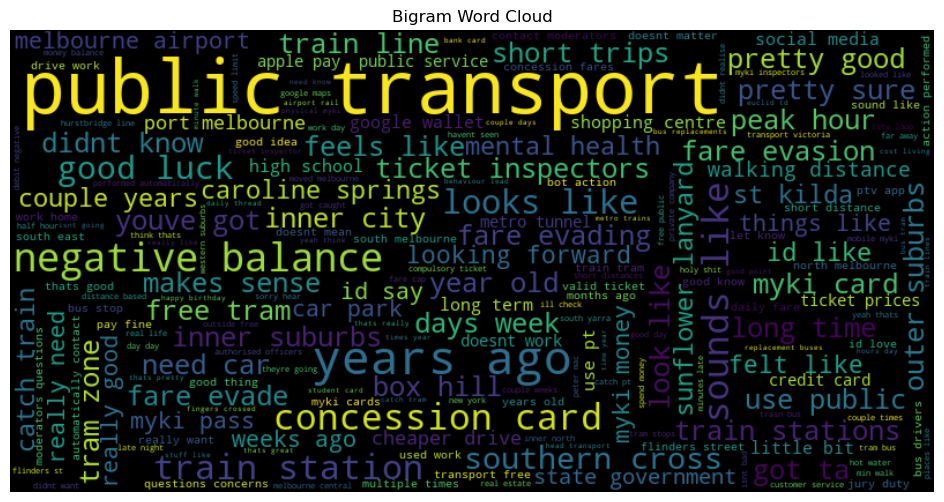

In [11]:
from sklearn.feature_extraction.text import CountVectorizer
from wordcloud import WordCloud
import matplotlib.pyplot as plt


texts = df['clean_text'].dropna().tolist()

# 2) Build bigram frequencies
vectorizer = CountVectorizer(ngram_range=(2,2), stop_words='english', min_df=5)
X = vectorizer.fit_transform(texts)
freq_dict = dict(zip(vectorizer.get_feature_names_out(), X.sum(axis=0).A1))

# 3) Generate & show the word cloud
wc = WordCloud(width=800, height=400)
wc.generate_from_frequencies(freq_dict)

plt.figure(figsize=(12,6))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.title("Bigram Word Cloud")
plt.show()

<h3>Graph Analysis</h3>

In [12]:
import networkx as nx

def build_reply_graph(posts_df, comments_df):
    # 1. Map every post_id/comment_id -> author_name
    author_map = dict(zip(posts_df['post_id'],    posts_df['author_name']))
    author_map.update(dict(zip(comments_df['comment_id'], comments_df['author_name'])))

    # 2. Build edge list: parent_author -> comment_author
    edges = []
    for _, row in comments_df.iterrows():
        pid = row['parent_id'].split('_', 1)[1] 
        parent_author = author_map.get(pid)
        if parent_author:
            edges.append((parent_author, row['author_name']))

    # 3. Create directed graph
    G = nx.DiGraph()
    G.add_edges_from(edges)

    # 4. Compute centralities
    centralities = {
        'degree':    nx.degree_centrality(G),
        'betweenness': nx.betweenness_centrality(G),
        'pagerank':  nx.pagerank(G),
        'eigenvector': nx.eigenvector_centrality(G, max_iter=1000)
    }

    return G, centralities


In [13]:
def print_top_n(centrality_dict, n=10):
    sorted_items = sorted(centrality_dict.items(), key=lambda kv: kv[1], reverse=True)
    for user, score in sorted_items[:n]:
        print(f"{user:20s} {score:.4f}")

In [14]:
G, centralities = build_reply_graph(posts_df, df)

In [15]:
sFileName = "SM_A2.graphml"
nx.write_graphml(G, sFileName)
print(f"Graph data saved to {sFileName}")

Graph data saved to SM_A2.graphml


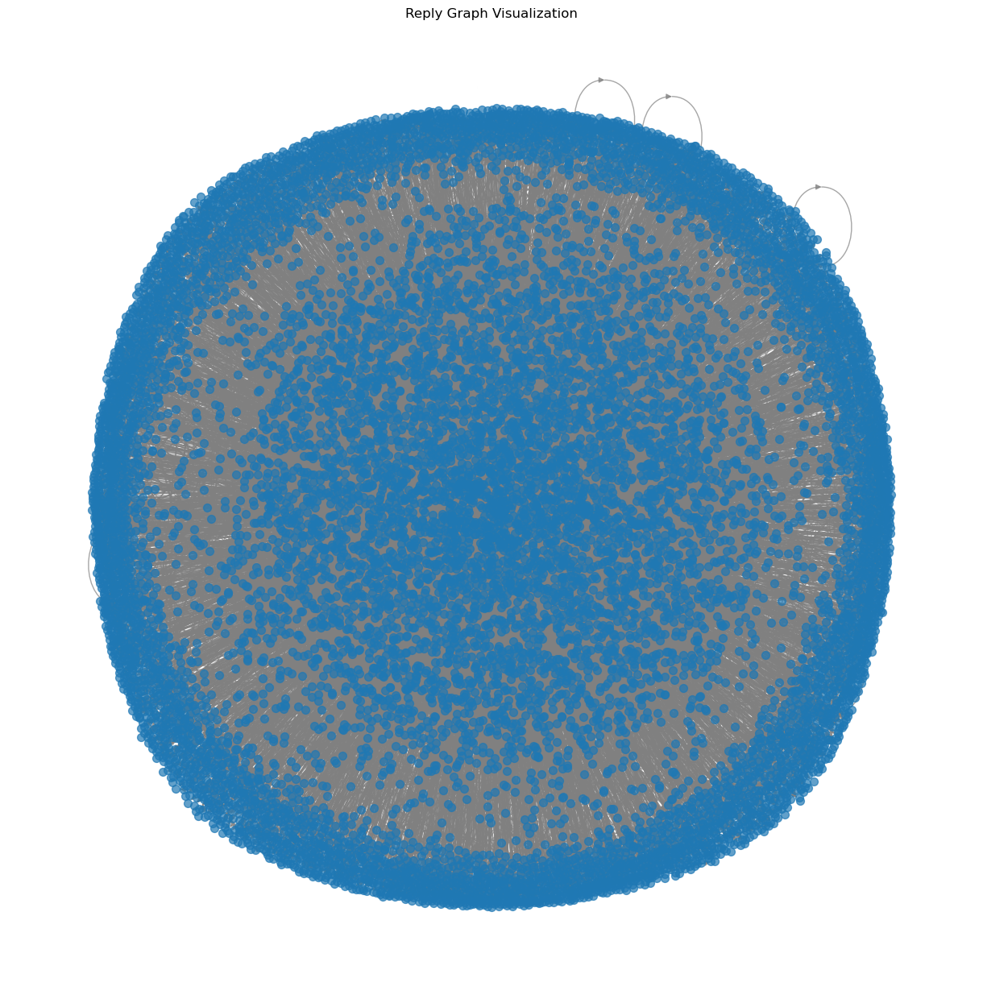

In [16]:
# Compute a layout
pos = nx.spring_layout(G, k=0.1, iterations=50)

# Draw the graph
plt.figure(figsize=(12, 12))
nx.draw(
    G,
    pos,
    node_size=50,
    edge_color='gray',
    with_labels=False,
    alpha=0.7
)
plt.title("Reply Graph Visualization")
plt.axis('off')
plt.show()

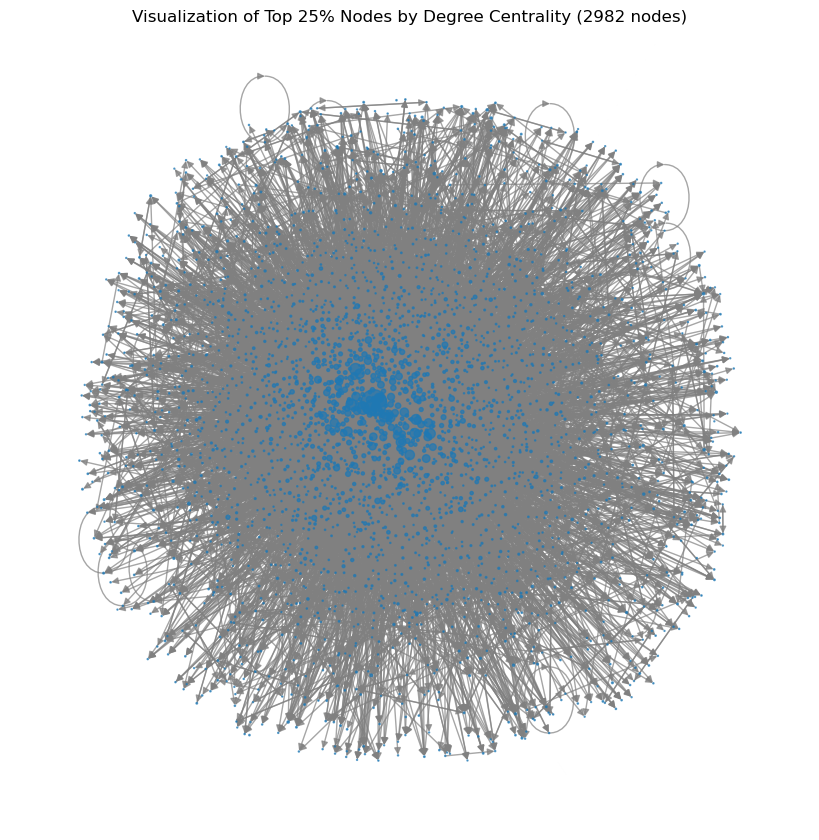

In [17]:

# 2. Compute degree centrality
deg_cent = nx.degree_centrality(G)

# 3. Determine the top 25% of nodes by centrality
n_top = max(1, int(len(G) * 0.25))
top_nodes = sorted(deg_cent, key=deg_cent.get, reverse=True)[:n_top]

# 4. Create the induced subgraph
H = G.subgraph(top_nodes).copy()

# 5. Compute layout for the subgraph
pos = nx.spring_layout(H, k=0.15, iterations=50)

# 6. Draw the subgraph
plt.figure(figsize=(8, 8))
node_sizes = [deg_cent[node] * 2000 for node in H.nodes()]
nx.draw(
    H,
    pos,
    node_size=node_sizes,
    edge_color='gray',
    with_labels=False,
    alpha=0.7
)
plt.title(f"Visualization of Top 25% Nodes by Degree Centrality ({n_top} nodes)")
plt.axis('off')
plt.show()

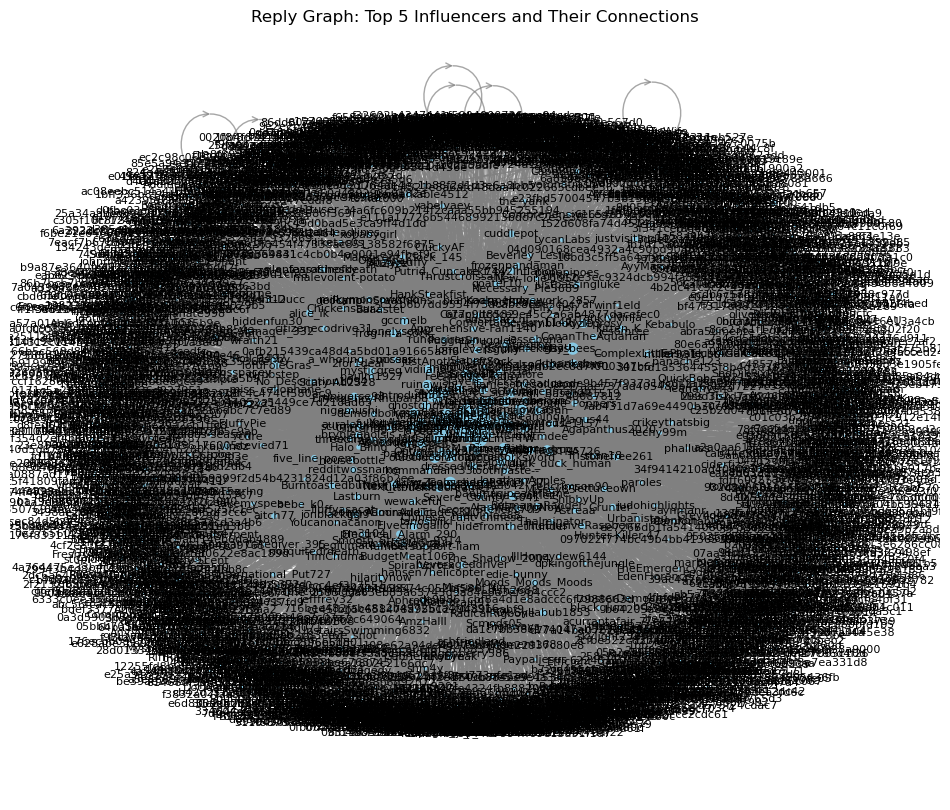

In [18]:
deg_centrality = nx.degree_centrality(G)

# Select top 01 influencers by degree
top_n = 1
top_nodes = sorted(deg_centrality, key=deg_centrality.get, reverse=True)[:top_n]

# Build subgraph of top influencers + their neighbors
sub_nodes = set(top_nodes)
for node in top_nodes:
    sub_nodes.update(G.predecessors(node))
    sub_nodes.update(G.successors(node))
H = G.subgraph(sub_nodes).copy()

plt.figure(figsize=(12, 10))
pos = nx.spring_layout(H, k=0.5, seed=42)

# Node sizes proportional to degree centrality
node_sizes = [deg_centrality.get(node, 0) * 3000 for node in H.nodes()]

nx.draw_networkx_nodes(H, pos, node_size=node_sizes, node_color='skyblue', alpha=0.9)
nx.draw_networkx_edges(H, pos, arrowstyle='->', arrowsize=10, edge_color='gray', alpha=0.7)
nx.draw_networkx_labels(H, pos, font_size=8)

plt.title("Reply Graph: Top 1 Influencers and Their Connections")
plt.axis('off')
plt.show()

In [19]:
def get_top_n_df(centrality_dict, n=5, label='score'):
    # Convert to DataFrame, sort, and reset index
    df = pd.DataFrame(list(centrality_dict.items()), columns=['user/node', label])
    df = df.sort_values(by=label, ascending=False).head(n).reset_index(drop=True)
    return df

# Example usage for each centrality type:
top5_degree      = get_top_n_df(centralities['degree'], n=5, label='Degree Centrality')
top5_betweenness = get_top_n_df(centralities['betweenness'], n=5, label='Betweenness Centrality')
top5_pagerank    = get_top_n_df(centralities['pagerank'], n=5, label='PageRank')
top5_eigenvector = get_top_n_df(centralities['eigenvector'], n=5, label='Eigenvector Centrality')

# Display all tables
print("Top 5 by Degree Centrality:")
display(top5_degree)
print("\nTop 5 by Betweenness Centrality:")
display(top5_betweenness)
print("\nTop 5 by PageRank:")
display(top5_pagerank)
print("\nTop 5 by Eigenvector Centrality:")
display(top5_eigenvector)

Top 5 by Degree Centrality:


,user/node,Degree Centrality
0,AutoModerator,0.173388
1,HurstbridgeLineFTW,0.040496
2,Jaybb3rw0cky,0.038149
3,Beast_of_Guanyin,0.035130
4,alsotheabyss,0.029764



Top 5 by Betweenness Centrality:


,user/node,Betweenness Centrality
0,AutoModerator,0.080770
1,HurstbridgeLineFTW,0.069232
2,PKMTrain,0.036267
3,Beast_of_Guanyin,0.028894
4,Jaybb3rw0cky,0.024630



Top 5 by PageRank:


,user/node,PageRank
0,Jaybb3rw0cky,0.007572
1,Beast_of_Guanyin,0.006552
2,HurstbridgeLineFTW,0.005771
3,epicpillowcase,0.004852
4,Goddess_Amaterasu,0.004616



Top 5 by Eigenvector Centrality:


,user/node,Eigenvector Centrality
0,Jaybb3rw0cky,0.239297
1,HurstbridgeLineFTW,0.222802
2,alsotheabyss,0.198970
3,fh3131,0.189152
4,Goddess_Amaterasu,0.186895


C:\Users\HP\AppData\Local\Temp\ipykernel_5476\440257992.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0, 0].set_xticklabels(top5_degree['user/node'], rotation=25)
C:\Users\HP\AppData\Local\Temp\ipykernel_5476\440257992.py:14: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0, 1].set_xticklabels(top5_betweenness['user/node'], rotation=25)
C:\Users\HP\AppData\Local\Temp\ipykernel_5476\440257992.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1, 0].set_xticklabels(top5_pagerank['user/node'], rotation=25)
C:\Users\HP\AppData\Local\Temp\ipykernel_5476\440257992.py:26: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1, 1].set_xticklabe

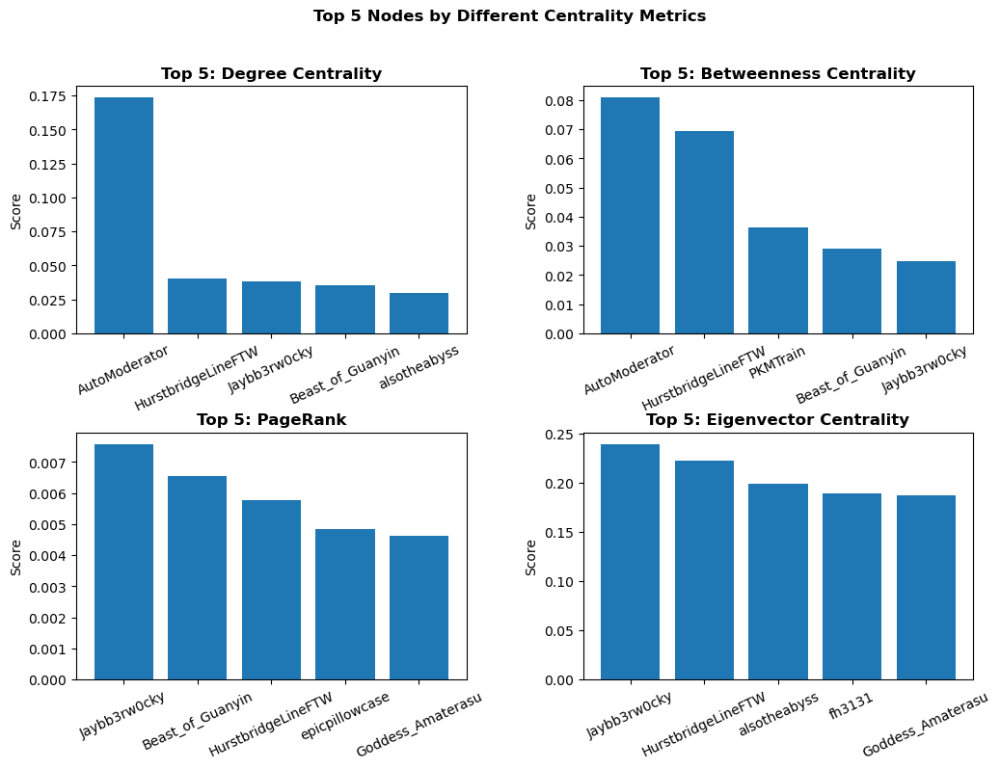

In [20]:
fig, axes = plt.subplots(2, 2, figsize=(12, 8))
plt.subplots_adjust(hspace=0.4, wspace=0.3)

# Degree Centrality
axes[0, 0].bar(top5_degree['user/node'], top5_degree['Degree Centrality'])
axes[0, 0].set_title('Top 5: Degree Centrality', fontweight='bold')
axes[0, 0].set_ylabel('Score')
axes[0, 0].set_xticklabels(top5_degree['user/node'], rotation=25)

# Betweenness Centrality
axes[0, 1].bar(top5_betweenness['user/node'], top5_betweenness['Betweenness Centrality'])
axes[0, 1].set_title('Top 5: Betweenness Centrality', fontweight='bold')
axes[0, 1].set_ylabel('Score')
axes[0, 1].set_xticklabels(top5_betweenness['user/node'], rotation=25)

# PageRank
axes[1, 0].bar(top5_pagerank['user/node'], top5_pagerank['PageRank'])
axes[1, 0].set_title('Top 5: PageRank', fontweight='bold')
axes[1, 0].set_ylabel('Score')
axes[1, 0].set_xticklabels(top5_pagerank['user/node'], rotation=25)

# Eigenvector Centrality
axes[1, 1].bar(top5_eigenvector['user/node'], top5_eigenvector['Eigenvector Centrality'])
axes[1, 1].set_title('Top 5: Eigenvector Centrality', fontweight='bold')
axes[1, 1].set_ylabel('Score')
axes[1, 1].set_xticklabels(top5_eigenvector['user/node'], rotation=25)

plt.suptitle('Top 5 Nodes by Different Centrality Metrics',fontweight='bold')
plt.show()

In [21]:
df['author_name'].value_counts()

author_name
Jaybb3rw0cky                        653
HurstbridgeLineFTW                  511
Goddess_Amaterasu                   487
HeyHeyItsMaryKay                    468
Beast_of_Guanyin                    450
                                   ... 
72b0f22910174e32a6ade8a6aa5f5818      1
72f7955e256646e690c807bda0d825d1      1
157eef4e787547f49bb9a59f228ec319      1
003e75c3d3794d88a39836f90377cc61      1
bmwiam                                1
Name: count, Length: 11879, dtype: int64

In [22]:
from networkx.algorithms import centrality, cluster, components
import community as community_louvain  # pip install python-louvain

# Communities (Louvain on undirected)
partition = community_louvain.best_partition(G.to_undirected())

# Global clustering / transitivity
trans = cluster.transitivity(G)

# Connected components
scc_count = nx.number_strongly_connected_components(G)
wcc_count = nx.number_weakly_connected_components(G)

# Bundle into a metrics dict
metrics = {
    'transitivity': trans,
    'n_scc': scc_count,
    'n_wcc': wcc_count,
    'communities': partition
}
metrics

{'transitivity': 0.009662856989495967,
 'n_scc': 6585,
 'n_wcc': 3,
 'communities': {'bronzecat83': 0,
  'flippingcoin': 0,
  'Hughcheu': 0,
  'n00bert81': 0,
  '5dca4f0d58484aa1bd96556e2c7ab668': 0,
  'loveracity': 0,
  'Scruffynz': 0,
  'sharethathalfandhalf': 0,
  'Ironic_Jedi': 0,
  '37563cf2cb1048629feb14eedad2a006': 0,
  'garion046': 0,
  'Kruxx85': 0,
  'InternationalPlant77': 0,
  'PaulFPerry': 1,
  'pothosrising': 0,
  'komos_': 0,
  'Away-Road-1333': 0,
  'Apoxie': 0,
  'Adorable_Throat_5265': 0,
  'ToonAlaska': 0,
  'Normal_Bird3689': 0,
  'Beast_of_Guanyin': 2,
  'hazysummersky': 0,
  'mjbojkowski': 3,
  'ResponsibleFetish': 3,
  'CatInternational2529': 0,
  'Lastburn': 2,
  'StandardAntique405': 0,
  'jordanaltn': 0,
  'Dependent-Age-6271': 0,
  'ptolani': 4,
  '536c40b142874975b72b3ce50e9a8a89': 0,
  'Daglish69': 1,
  'starryeyedvirgo': 0,
  'forbiddenknowledg3': 5,
  'SamURLJackson': 6,
  'alt-cynic': 0,
  'dark_mode_everything': 7,
  'Careless-Success-126': 0,
  'AliceA

In [23]:
from collections import Counter
comm_sizes = Counter(partition.values())
comm_sizes

Counter({2: 2944,
         1: 710,
         3: 467,
         27: 459,
         7: 455,
         22: 411,
         9: 392,
         25: 388,
         15: 386,
         20: 385,
         19: 363,
         13: 325,
         23: 322,
         21: 311,
         18: 282,
         4: 276,
         17: 275,
         24: 260,
         8: 248,
         14: 234,
         5: 230,
         12: 228,
         0: 206,
         28: 203,
         26: 193,
         16: 189,
         6: 168,
         11: 160,
         31: 134,
         29: 93,
         54: 55,
         55: 46,
         37: 18,
         42: 9,
         53: 8,
         45: 7,
         35: 6,
         39: 5,
         40: 5,
         49: 5,
         50: 5,
         56: 5,
         57: 5,
         33: 4,
         41: 4,
         59: 4,
         34: 3,
         38: 3,
         43: 3,
         44: 3,
         46: 3,
         47: 3,
         48: 3,
         51: 3,
         58: 3,
         60: 3,
         30: 2,
         32: 2,
         36: 2,
   

Community 8 is the largest (289 members). That’s your biggest conversational sub‐network.The largest communities represent the core groups of users who are densely replying among themselves.

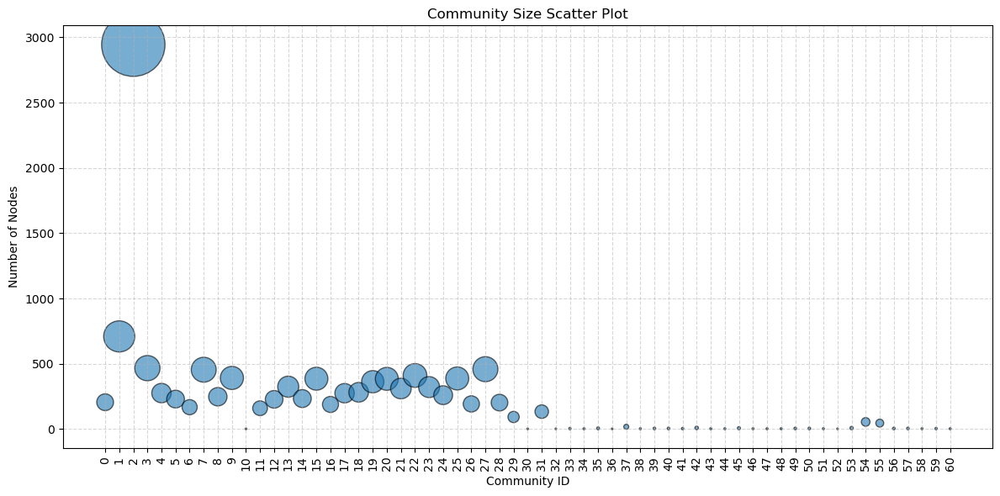

In [24]:
communities = list(comm_sizes.keys())
sizes       = list(comm_sizes.values())

# 3. Scale marker area by size
marker_sizes = [s * 1 for s in sizes]  # tweak the multiplier as needed

# 4. Plot
plt.figure(figsize=(12, 6))
plt.scatter(communities, sizes, s=marker_sizes, alpha=0.6, edgecolor='k')

plt.xticks(communities, rotation=90)
plt.xlabel('Community ID')
plt.ylabel('Number of Nodes')
plt.title('Community Size Scatter Plot')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

In [25]:
comm_df = pd.DataFrame(
    list(partition.items()), 
    columns=['author_name','community']
)

In [26]:
comm_df

,author_name,community
0,bronzecat83,0
1,flippingcoin,0
2,Hughcheu,0
3,n00bert81,0
4,5dca4f0d58484aa1bd96556e2c7ab668,0
...,...,...
11923,stupid-sexy-packets,2
11924,Impossible_Egg929,22
11925,wynnefraser,2
11926,hillmanwings,2


In [27]:
deg_cent = centrality.degree_centrality(G)
metrics_df = pd.DataFrame({
    'author': list(deg_cent.keys()),
    'in_degree_cent': list(deg_cent.values()),
    'community': [partition.get(a, -1) for a in deg_cent]
})

In [28]:
def build_diffusion_graph(posts, comments):
    """
    Builds a directed 'diffusion' graph where:
      - Nodes are post_ids and comment_ids
      - Edges point from parent (post/comment) to child comment
      - Node attributes include author and timestamp
    """
    G_diff = nx.DiGraph()
    
    # Add posts as roots
    for _, row in posts.iterrows():
        G_diff.add_node(
            row['post_id'],
            author=row['author_name'],
            timestamp=row['created_utc'],
            type='post'
        )
    
    # Add comments and edges
    for _, row in comments.iterrows():
        parent_id = row['parent_id'].split('_', 1)[1]
        cid = row['comment_id']
        
        # add comment node
        G_diff.add_node(
            cid,
            author=row['author_name'],
            timestamp=row['created_utc'],
            type='comment'
        )
        # add edge if parent exists
        if parent_id in G_diff:
            G_diff.add_edge(parent_id, cid)
    
    return G_diff

In [29]:
G_diff = build_diffusion_graph(posts_df, df)

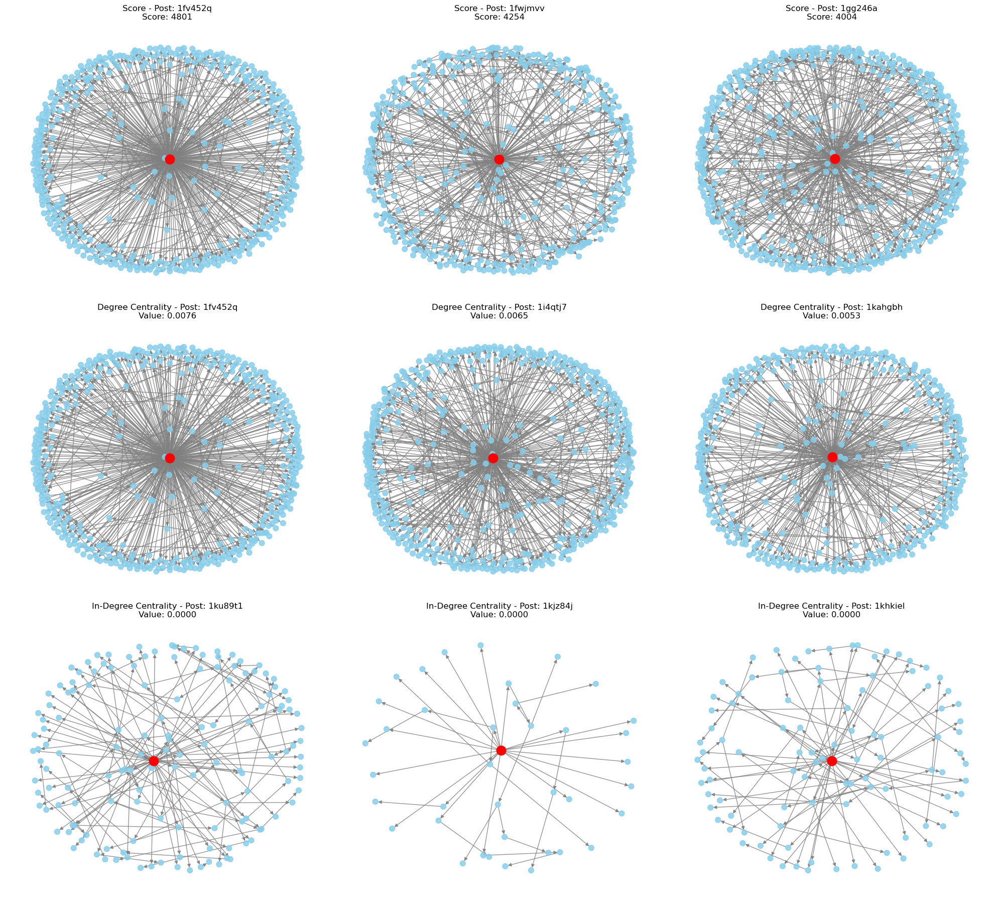

In [32]:
# 1. Top 3 by score
top_score_posts = posts_df.sort_values(by="score", ascending=False).head(3)
top_score_ids = top_score_posts['post_id'].tolist()
top_score_vals = top_score_posts['score'].tolist()

# 2. Top 3 by degree centrality
deg_cent = nx.degree_centrality(G_diff)
post_nodes = [n for n, d in G_diff.nodes(data=True) if d['type'] == 'post']
top_deg = sorted(post_nodes, key=lambda n: deg_cent[n], reverse=True)[:3]
top_deg_vals = [deg_cent[n] for n in top_deg]

# 3. Top 3 by in-degree centrality
in_deg_cent = nx.in_degree_centrality(G_diff)
top_in_deg = sorted(post_nodes, key=lambda n: in_deg_cent[n], reverse=True)[:3]
top_in_deg_vals = [in_deg_cent[n] for n in top_in_deg]

# 4. Facet grid: 3 rows x 3 columns
fig, axes = plt.subplots(3, 3, figsize=(20, 18))
axes = axes.flatten()

for i, (post_id, val, label) in enumerate(zip(
    top_score_ids + top_deg + top_in_deg,
    top_score_vals + top_deg_vals + top_in_deg_vals,
    (["Score"]*3) + (["Degree Centrality"]*3) + (["In-Degree Centrality"]*3)
)):
    descendants = nx.descendants(G_diff, post_id)
    cascade = G_diff.subgraph({post_id} | descendants)
    pos = nx.spring_layout(cascade, k=0.6, seed=42)
    node_colors = ['red' if cascade.nodes[n]['type'] == 'post' else 'skyblue' for n in cascade.nodes()]
    nx.draw_networkx(
        cascade,
        pos,
        with_labels=False,
        node_size=60,
        node_color=node_colors,
        edge_color='gray',
        alpha=0.85,
        arrows=True,
        ax=axes[i]
    )
    nx.draw_networkx_nodes(
        cascade, pos,
        nodelist=[post_id],
        node_color='red',
        node_size=180,
        ax=axes[i]
    )
    axes[i].set_title(f"{label} - Post: {post_id}\nValue: {val:.4f}" if isinstance(val, float) else f"{label} - Post: {post_id}\nScore: {val}")
    axes[i].axis('off')

plt.tight_layout()
plt.show()

<h3>Sentiment Analysis</h3>

In [78]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import matplotlib.pyplot as plt
from nltk.util import ngrams
import numpy as np
def execute_sentiment_analysis(df):
    analyzer = SentimentIntensityAnalyzer()
    df['sentiment'] = df['clean_text'].apply(lambda x: analyzer.polarity_scores(x)['compound'])
    df['sentiment_category'] = pd.cut(df['sentiment'],
                                      bins=[-1, -0.5, 0.5, 1],
                                      labels=['Negative', 'Neutral', 'Positive'])
    plot_overall_sentiment_category(df)
    
def avg_bigram_sentiment(text):
    analyzer = SentimentIntensityAnalyzer()
    if not isinstance(text, str):
        text = str(text) if text is not None else ''
    tokens = text.split()
    if len(tokens) < 2:
        return 0
    bigrams = list(ngrams(tokens, 2))
    scores = [analyzer.polarity_scores(' '.join(bg))['compound'] for bg in bigrams]
    return np.mean(scores)
    

def display_bigram_sentiment(df):
    df['bigram_sentiment'] = df['clean_text'].apply(avg_bigram_sentiment)
    df['bigram_sentiment_category'] = pd.cut(
        df['bigram_sentiment'],
        bins=[-1, -0.5, 0.5, 1],
        labels=['Negative', 'Neutral', 'Positive']
    )
    plot_overall_bigram_sentiment_category(df)

In [71]:
def plot_overall_bigram_sentiment_category(df):
    sentiment_counts = df['bigram_sentiment'].value_counts()
    # Plot bar chart
    plt.figure(figsize=(8, 5))
    sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values, palette='Set2')
    plt.title("Overall Bigram Sentiment Category Distribution")
    plt.xlabel("Sentiment")
    plt.ylabel("Number of Posts")
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.show()

In [34]:
def plot_overall_sentiment_category(df):
    sentiment_counts = df['sentiment_category'].value_counts()
    # Plot bar chart
    plt.figure(figsize=(8, 5))
    sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values, palette='Set2')
    plt.title("Overall Sentiment Category Distribution")
    plt.xlabel("Sentiment")
    plt.ylabel("Number of Posts")
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.show()

C:\Users\HP\AppData\Local\Temp\ipykernel_5476\2373081247.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values, palette='Set2')


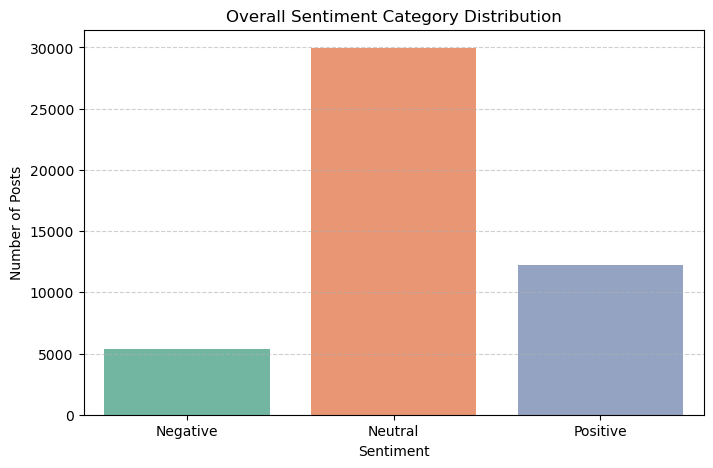

In [75]:
df['clean_text'] = df['clean_text'].fillna('').astype(str)
execute_sentiment_analysis(df)

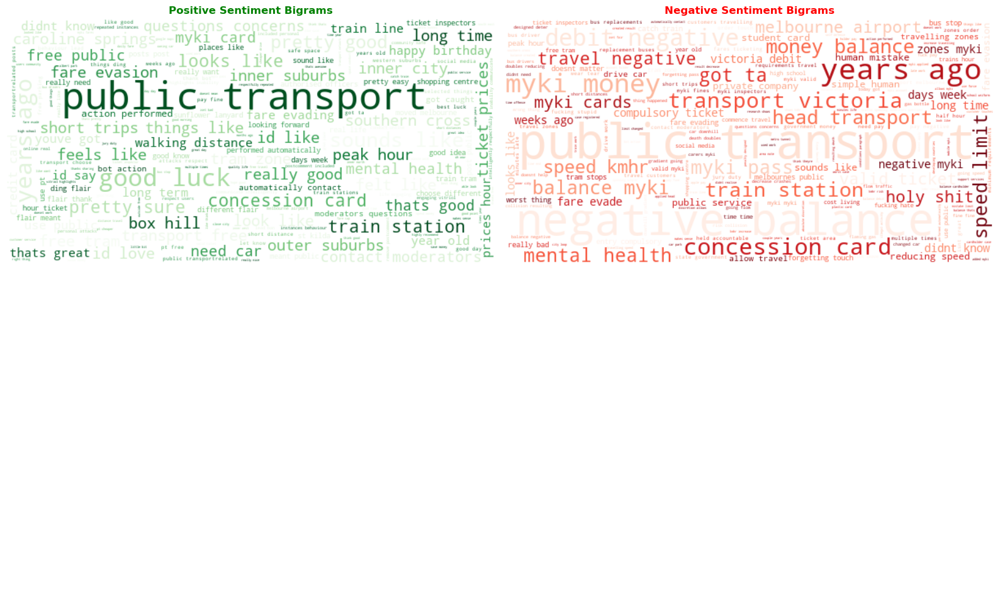

In [36]:
def pos_neg_sentiments(df):

     # 2. Prepare texts
    pos_texts = df[df['sentiment_category'] == 'Positive']['clean_text'].dropna().tolist()
    neg_texts = df[df['sentiment_category'] == 'Negative']['clean_text'].dropna().tolist()

    # 3. Vectorizers for bigrams
    vectorizer = CountVectorizer(ngram_range=(2,2), stop_words='english')

    # Positive bigram frequencies
    if pos_texts:
        X_pos = vectorizer.fit_transform(pos_texts)
        pos_freq = dict(zip(vectorizer.get_feature_names_out(), X_pos.toarray().sum(axis=0)))
        wc_pos = WordCloud(width=600, height=300, background_color='white', colormap='Greens').generate_from_frequencies(pos_freq)
    else:
        wc_pos = None

    # Negative bigram frequencies
    vectorizer = CountVectorizer(ngram_range=(2,2), stop_words='english')  # reset
    if neg_texts:
        X_neg = vectorizer.fit_transform(neg_texts)
        neg_freq = dict(zip(vectorizer.get_feature_names_out(), X_neg.toarray().sum(axis=0)))
        wc_neg = WordCloud(width=600, height=300, background_color='white', colormap='Reds').generate_from_frequencies(neg_freq)
    else:
        wc_neg = None

    # 4. Plot in 2x2 facet
    fig, axes = plt.subplots(2, 2, figsize=(16, 10))
    # Positive top-left
    axes[0, 0].set_title("Positive Sentiment Bigrams", color="green", fontweight="bold")
    if wc_pos:
        axes[0, 0].imshow(wc_pos, interpolation='bilinear')
    axes[0, 0].axis('off')
    # Negative top-right
    axes[0, 1].set_title("Negative Sentiment Bigrams", color="red", fontweight="bold")
    if wc_neg:
        axes[0, 1].imshow(wc_neg, interpolation='bilinear')
    axes[0, 1].axis('off')
    # Optionally fill other facets or leave blank
    for ax in [axes[1, 0], axes[1, 1]]:
        ax.axis('off')
    plt.tight_layout()
    plt.show()

pos_neg_sentiments(df)

In [37]:
#merging two df on basis of author
comm_df = pd.DataFrame(list(partition.items()), columns=['author_name', 'community'])
df = df.merge(comm_df, on='author_name', how='left')


In [38]:
avg_by_user = (
    df
      .groupby('author_name')['sentiment']
      .mean()
      .reset_index()
      .sort_values('sentiment', ascending=False)
)

avg_by_comm = (
    df
      .groupby('community')['sentiment']
      .mean()
      .reset_index()
      .sort_values('sentiment', ascending=False)
)

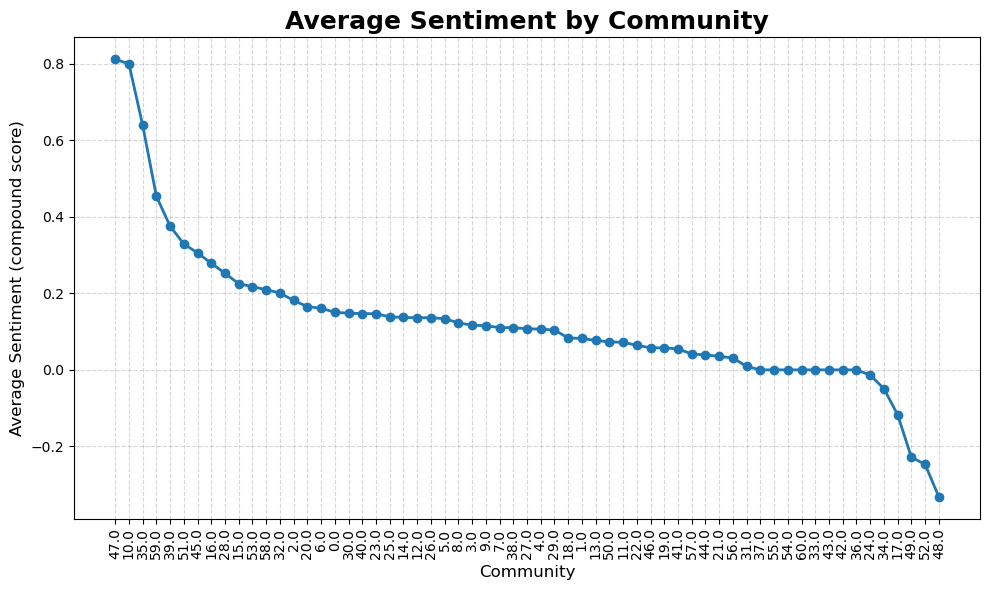

In [39]:
comm_labels = avg_by_comm['community'].astype(str)

plt.figure(figsize=(10, 6))
plt.plot(
    comm_labels,
    avg_by_comm['sentiment'],
    marker='o',
    linestyle='-',
    linewidth=2
)
plt.xlabel('Community', fontsize=12)
plt.ylabel('Average Sentiment (compound score)', fontsize=12)
plt.title('Average Sentiment by Community', fontsize=18, fontweight='bold')
plt.xticks(rotation=90)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

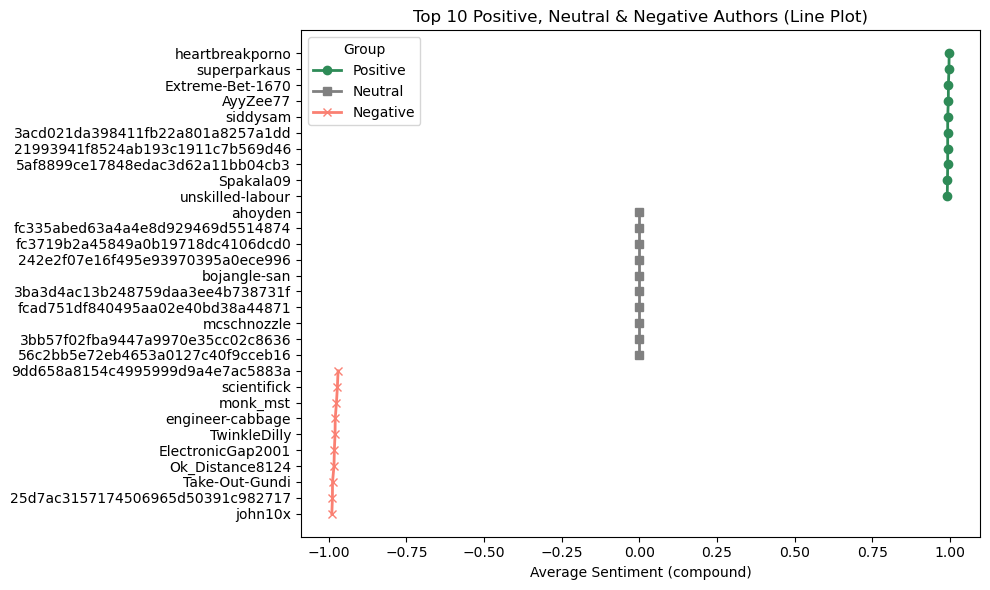

In [40]:
N = 10

# Top N positive
top_pos = avg_by_user.head(N).copy()
top_pos['group'] = 'Positive'

# Top N negative
top_neg = avg_by_user.tail(N).copy()
top_neg['group'] = 'Negative'

# Top N neutral (smallest absolute sentiment) among the middle
middle = avg_by_user.iloc[N:-N].copy()
neutral = (
    middle.assign(abs_sent=middle['sentiment'].abs())
          .sort_values('abs_sent')
          .head(N)
          .drop(columns='abs_sent')
)
neutral['group'] = 'Neutral'

# Combine in order for plotting
subset = pd.concat([top_pos, neutral, top_neg]).reset_index(drop=True)

fig, ax = plt.subplots(figsize=(10, 6))

# Map groups to styles
styles = {
    'Positive': {'marker': 'o', 'color': 'seagreen'},
    'Neutral':  {'marker': 's', 'color': 'gray'},
    'Negative': {'marker': 'x', 'color': 'salmon'}
}

# Create numeric positions for each author
positions = range(len(subset))
ax.set_yticks(positions)
ax.set_yticklabels(subset['author_name'])

# Plot each group as its own line
for group, style in styles.items():
    grp_df = subset[subset['group'] == group]
    # Get y positions of these authors
    y_pos = [subset.index.get_loc(idx) for idx in grp_df.index]
    ax.plot(
        grp_df['sentiment'],
        y_pos,
        label=group,
        marker=style['marker'],
        color=style['color'],
        linestyle='-',
        linewidth=2
    )

# Formatting
ax.set_xlabel('Average Sentiment (compound)')
ax.set_title(f'Top {N} Positive, Neutral & Negative Authors (Line Plot)')
ax.invert_yaxis()  # Highest at the top
ax.legend(title='Group')
plt.tight_layout()
plt.show()

<h3>Topic Modelling</h3>

In [117]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

def display_sentiment_by_topic(df):
    # Increment topic labels by 1
    df = df.copy()
    df['topic_label'] = df['dominant_topic'] + 1
    
    sentiment_by_topic = (
        df.groupby('topic_label')['sentiment_category']
          .value_counts(normalize=True)
          .unstack()
    )
    sentiment_by_topic.plot(kind='bar', stacked=True, figsize=(10, 6))
    plt.title('Sentiment Distribution by Topic')
    plt.xlabel('Topic')
    plt.ylabel('Proportion')
    plt.legend(title='Sentiment')
    plt.tight_layout()
    plt.show()


def display_topic_wordclouds(model, feature_names, cols=2):
    n_topics = model.components_.shape[0]
    rows = (n_topics + cols - 1) // cols  # Ceiling division
    fig, axes = plt.subplots(rows, cols, figsize=(12*cols, 6*rows))

    # Handle the axes array shape for 1 row/1 topic case
    if rows == 1:
        axes = [axes] if n_topics == 1 else axes
    axes = axes.flatten()

    for topic_idx, topic in enumerate(model.components_):
        topic_words = dict(zip(feature_names, topic))
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(topic_words)
        ax = axes[topic_idx]
        ax.imshow(wordcloud, interpolation='bilinear')
        ax.axis('off')
        ax.set_title(f'Word Cloud for Topic {topic_idx + 1}', fontsize = 14 , fontweight='bold')
    # Hide unused axes
    for i in range(topic_idx + 1, len(axes)):
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

def topic_modeling(df, community = None, n_topics=3, n_top_words=10):
    if community:
        community_df = df[df['community'] == community]
        mask = df['community'] == community
        sub = df.loc[mask, 'clean_text'].dropna()

    vectorizer = CountVectorizer(ngram_range=(2, 2),max_df=0.9, min_df=2, stop_words='english')
    if community:
        X = vectorizer.fit_transform(community_df['clean_text'].dropna())
    else:
         X = vectorizer.fit_transform(df['clean_text'].dropna())
    lda = LatentDirichletAllocation(n_components=n_topics, random_state=42)
    lda_output = lda.fit_transform(X)
    df_1 = df.copy()
    
    if community:
        df_1.loc[sub.index, 'dominant_topic'] = lda_output.argmax(axis=1)
    else:
        df_1['dominant_topic'] = lda_output.argmax(axis=1)
    if community:
        print(f"\nCommunity {community} (n={len(community_df)}) Topics:")
    feature_names = vectorizer.get_feature_names_out()
    for topic_idx, topic in enumerate(lda.components_):
        top_features = [feature_names[i] for i in topic.argsort()[:-n_top_words - 1:-1]]
        print(f"  Topic {topic_idx + 1}: {', '.join(top_features)}")
    display_topic_wordclouds(lda, feature_names)
    display_sentiment_by_topic(df_1)


Community 2.0 (n=20122) Topics:
  Topic 1: action performed, automatically contact, questions concerns, bot action, contact moderators, performed automatically, moderators questions, public transport
  Topic 2: public transport, sounds like, feels like, years ago, year old, makes sense, really good, st kilda
  Topic 3: good luck, years ago, got ta, good idea, hot water, sorry hear, looks like, things like
  Topic 4: looks like, years ago, happy birthday, didnt know, look like, daily thread, good morning, sounds like


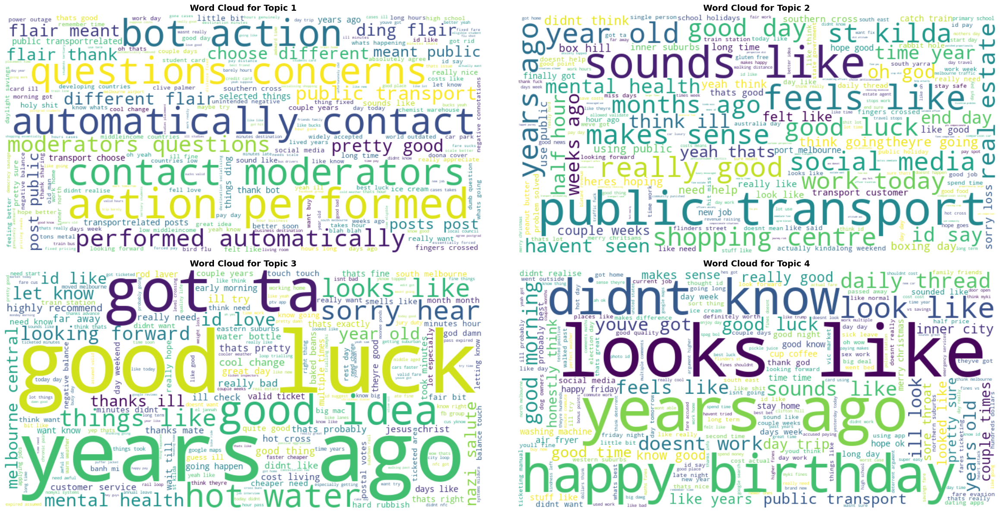

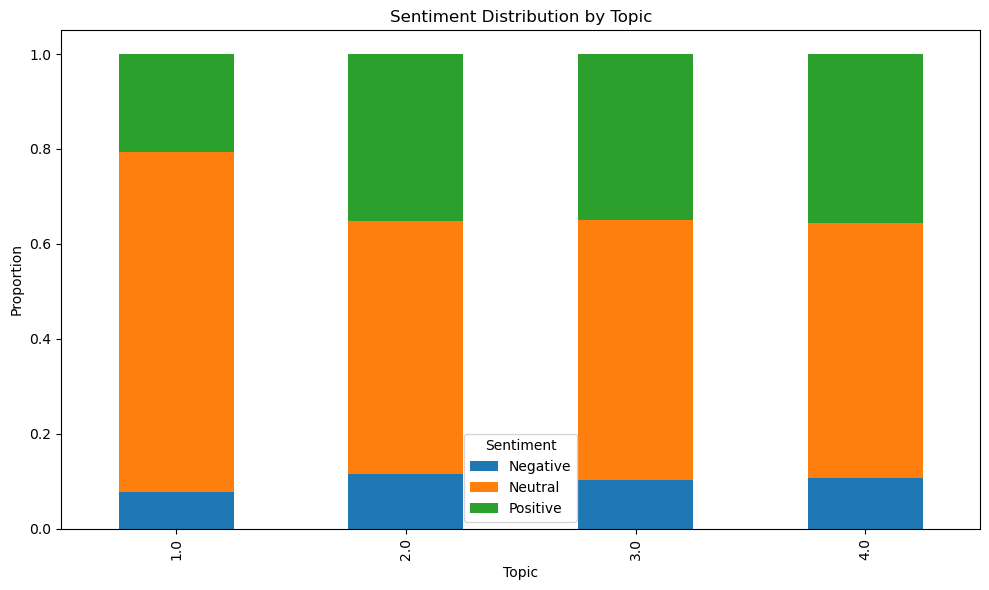


Community 1.0 (n=2664) Topics:
  Topic 1: public transport, concession card, outer suburbs, hour fare, daily fare, years ago, train line, got stopped
  Topic 2: public transport, debit negative, caroline springs, negative balance, transport victoria, head transport, private schools, years ago
  Topic 3: ticket prices, prices hour, hour ticket, speed limit, speed kmhr, prices daily, lose ability, public transport
  Topic 4: years ago, public transport, concession card, southern cross, myki pass, myki money, negative balance, negative myki


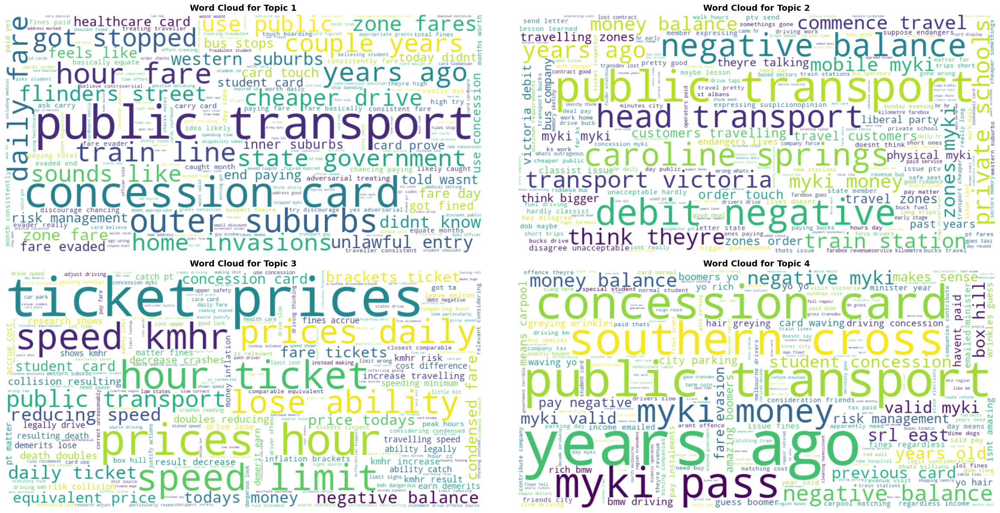

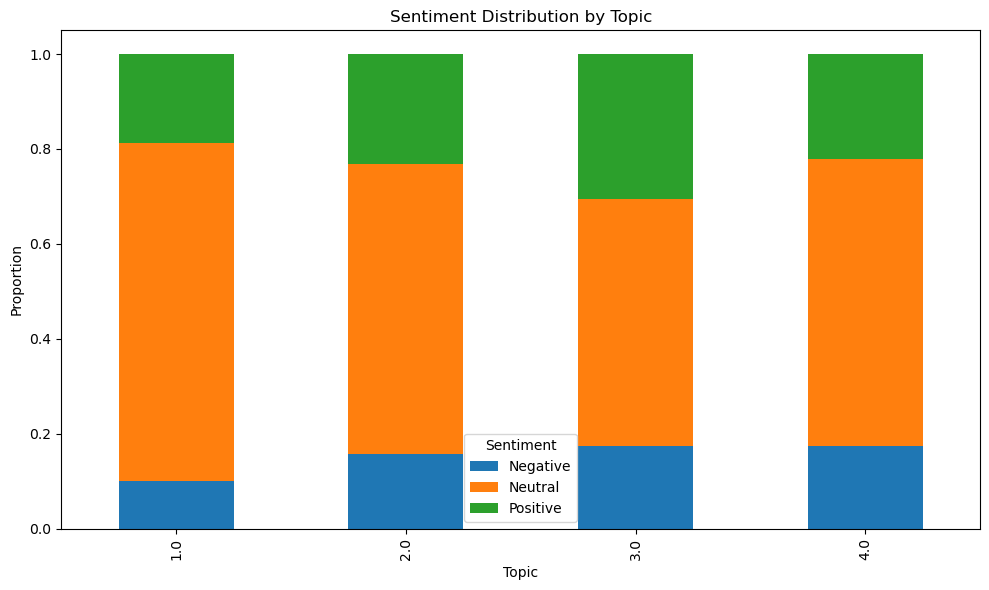


Community 3.0 (n=1649) Topics:
  Topic 1: metro tunnel, years ago, tender process, apple pay, fare evasion, credit cards, negative balance, isnt bad
  Topic 2: apple pay, concession card, level crossings, crossings removed, public transport, sounds like, steal right, government money
  Topic 3: public transport, short trips, inner city, isnt going, distance based, outer suburbs, travel zone, based fares
  Topic 4: public transport, inner city, transport free, years ago, community fine, claim driver, especially harming, harming community


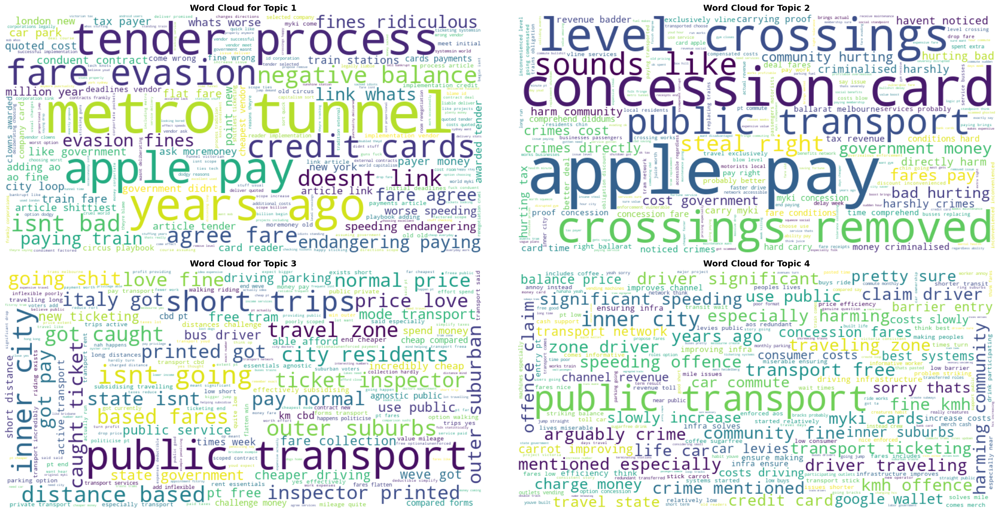

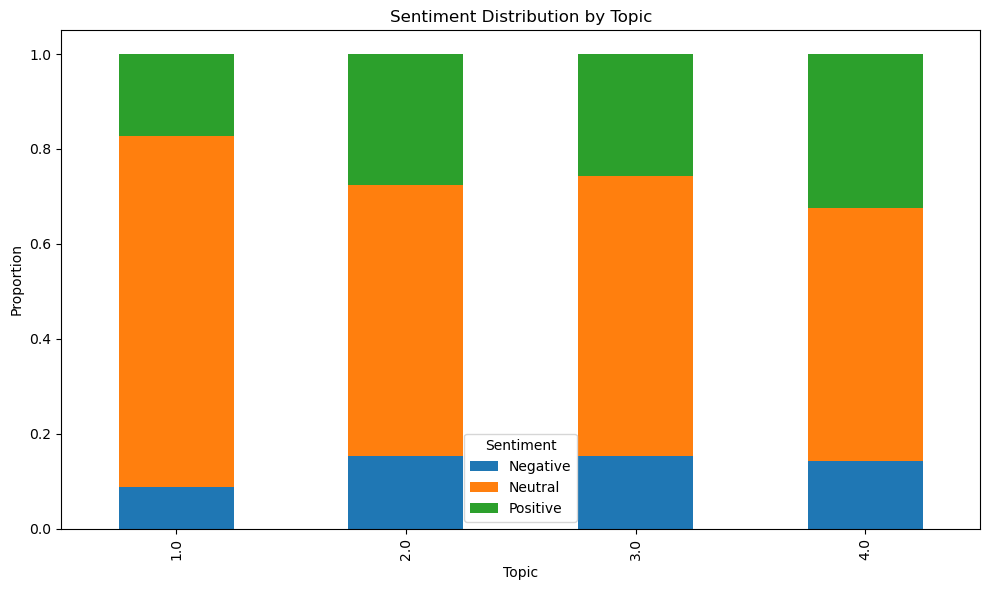

In [118]:
# 1) get unique-author counts per community
author_comm = df[['author_name','community']].drop_duplicates()
user_counts = author_comm['community'].value_counts()

# 2) pick the top 3 communities by user count
top3_by_users = user_counts.head(3).index.tolist()
for comm in top3_by_users:
    topic_modeling(df, comm, n_topics=4, n_top_words=8)

In [ ]:
#overall topic modelling 
topic_modeling(df, None ,n_topics=6, n_top_words=8)